In [2]:
import os
import cv2
import json
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

import albumentations as A

In [4]:
with open('/opt/ml/detection/dataset/train.json', 'r') as f:
    data_json = json.loads(f.read())

In [10]:
anno = data_json['annotations']
images = data_json['images']
cat = data_json['categories']

In [8]:
labels = [0 for _ in range(10)]
len(images)

4883

In [11]:
for a in anno:
    id = a['category_id']
    labels[id] += 1

In [17]:
lb = {cat[i]['name']:labels[i] for i in range(10) }

In [32]:
lb

{'General trash': 3966,
 'Paper': 6352,
 'Paper pack': 897,
 'Metal': 936,
 'Glass': 982,
 'Plastic': 2943,
 'Styrofoam': 1263,
 'Plastic bag': 5178,
 'Battery': 159,
 'Clothing': 468}

AttributeError: 'dict' object has no attribute 'sort'

<BarContainer object of 10 artists>

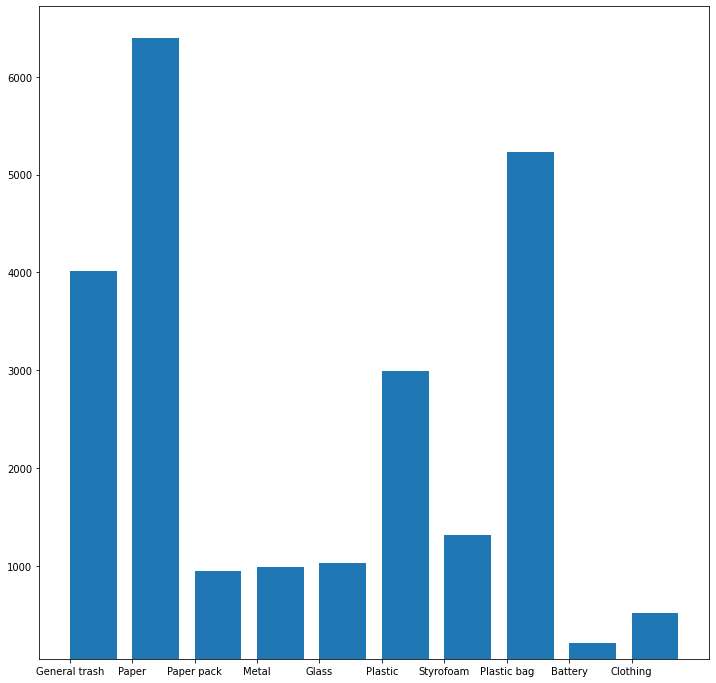

In [30]:
fig, ax = plt.subplots(1,1, figsize=(12, 12))

plt.bar(lb.keys(), lb.values(), width=0.75, bottom=50, align='edge')

In [26]:
import matplotlib.colors as mcolors
colors = list(mcolors.TABLEAU_COLORS.values())
plt.rcParams['figure.facecolor'] = 'white'

In [38]:
image_ids = [
    118, 292, 1113, 2140, 2213
]

In [39]:
base = '/opt/ml/detection/dataset'
image_dir = os.path.join(base, 'train')
image_path = [os.path.join(image_dir, str(image_id).zfill(4) + '.jpg') for image_id in image_ids]

In [40]:
images = [
    cv2.cvtColor(cv2.imread(image), cv2.COLOR_BGR2RGB)
    for image in image_path
]

In [44]:
transforms = [ 
    eval(f"""A.Compose([
        A.RandomBrightnessContrast(brightness_limit=1, contrast_limit=1, p=1.0)
        ])""") for _ in range(5)
]

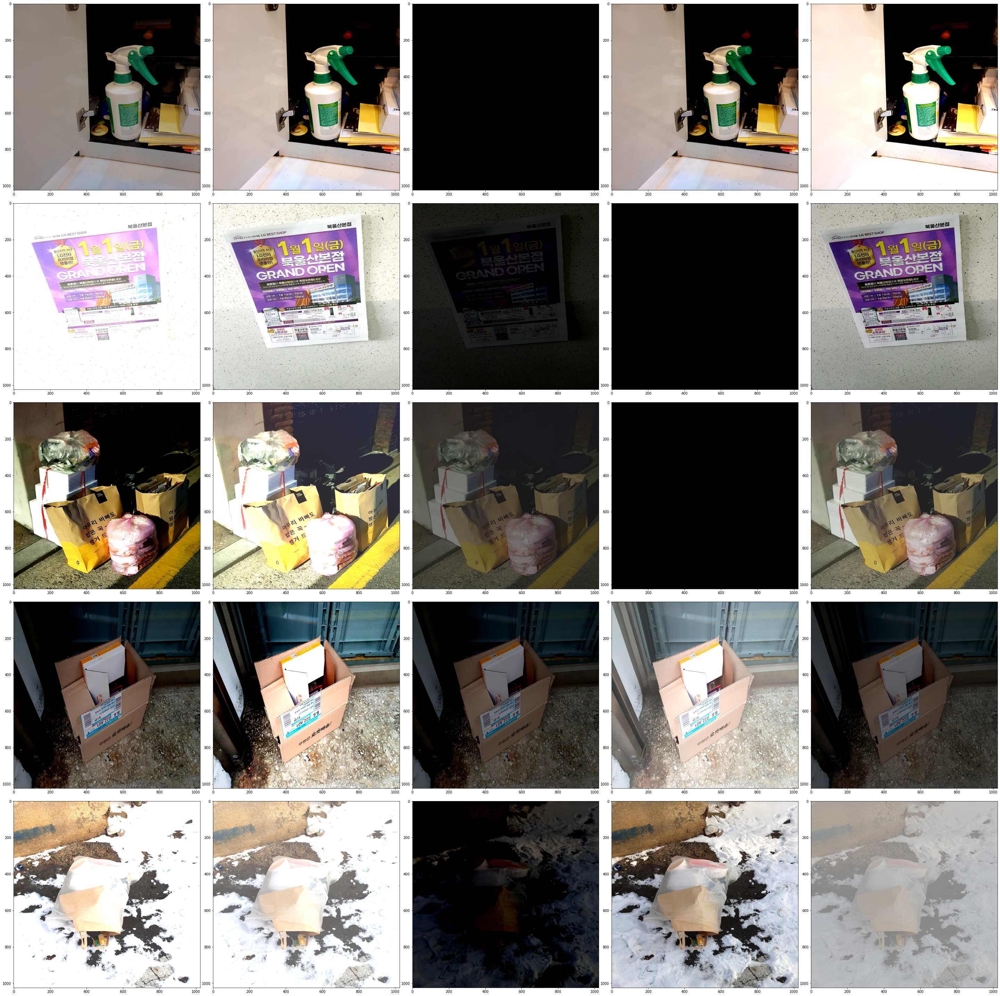

In [46]:
fig, ax = plt.subplots(5, 5, figsize=(40, 40))
axes = ax.flatten()
idx = 0

for image in images:
    for transform in transforms:
        axes[idx].imshow(transform(image=image)['image'])
        idx += 1
plt.tight_layout()
plt.show() 


In [49]:
transforms = A.Compose([
    A.CLAHE(p=1)
])

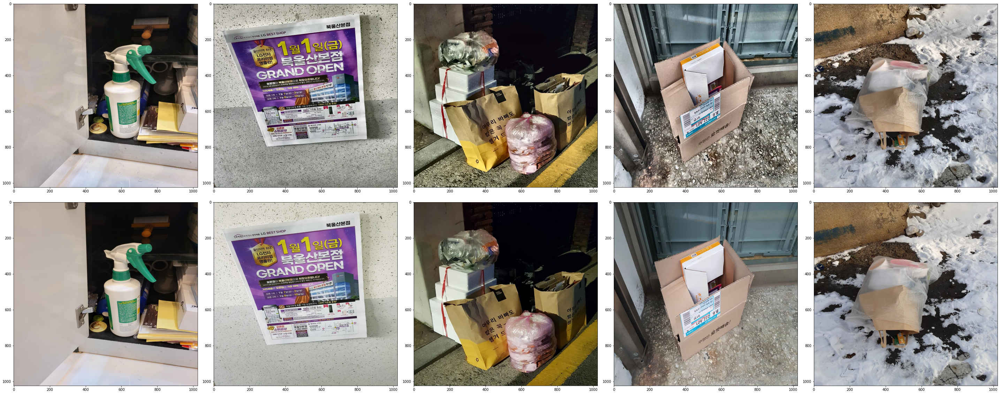

In [52]:
fig, ax = plt.subplots(2, 5, figsize=(40, 16))

for idx, image in enumerate(images):
    ax[0][idx].imshow(transforms(image=image)['image'])
    ax[1][idx].imshow(image)

plt.tight_layout()
plt.show() 
